<a href="https://colab.research.google.com/github/vedanshipathak/Plastic-Detection-Model/blob/main/Plastic_Pollution_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!git clone https://github.com/pedropro/TACO.git

Cloning into 'TACO'...
remote: Enumerating objects: 740, done.
remote: Counting objects: 100% (435/435), done.
remote: Compressing objects: 100% (55/55), done.
remote: Total 740 (delta 416), reused 380 (delta 380), pack-reused 305 (from 1)
Receiving objects: 100% (740/740), 97.48 MiB | 22.87 MiB/s, done.
Resolving deltas: 100% (499/499), done.


In [ ]:
!cd TACO

 # Replace with your repo name

In [ ]:
!ls  # You should see folders like "images" and "annotations"

drive  sample_data  TACO


In [ ]:
!pip install pandas requests Pillow


In [ ]:
import pandas as pd

# Load the CSV file
csv_file_path = "/content/TACO/data/all_image_urls.csv"  # replace with your CSV file path
df = pd.read_csv(csv_file_path)

# Show the first few rows of the CSV to inspect the structure
print(df.head())


  https://farm66.staticflickr.com/65535/33978196618_632623b4fc_z.jpg  \
0  https://farm66.staticflickr.com/65535/47803331...                   
1  https://farm66.staticflickr.com/65535/40888872...                   
2  https://farm66.staticflickr.com/65535/47803331...                   
3  https://farm66.staticflickr.com/65535/33978199...                   
4  https://farm66.staticflickr.com/65535/33978200...                   

  https://farm66.staticflickr.com/65535/33978196618_e30a59e0a8_o.png  
0  https://farm66.staticflickr.com/65535/47803331...                  
1  https://farm66.staticflickr.com/65535/40888872...                  
2  https://farm66.staticflickr.com/65535/47803331...                  
3  https://farm66.staticflickr.com/65535/33978199...                  
4  https://farm66.staticflickr.com/65535/33978200...                  


In [ ]:
# Print the column names
print(df.columns)


Index(['https://farm66.staticflickr.com/65535/33978196618_632623b4fc_z.jpg', 'https://farm66.staticflickr.com/65535/33978196618_e30a59e0a8_o.png'], dtype='object')


  https://farm66.staticflickr.com/65535/33978196618_632623b4fc_z.jpg  \
0  https://farm66.staticflickr.com/65535/47803331...                   
1  https://farm66.staticflickr.com/65535/40888872...                   
2  https://farm66.staticflickr.com/65535/47803331...                   
3  https://farm66.staticflickr.com/65535/33978199...                   
4  https://farm66.staticflickr.com/65535/33978200...                   

  https://farm66.staticflickr.com/65535/33978196618_e30a59e0a8_o.png  
0  https://farm66.staticflickr.com/65535/47803331...                  
1  https://farm66.staticflickr.com/65535/40888872...                  
2  https://farm66.staticflickr.com/65535/47803331...                  
3  https://farm66.staticflickr.com/65535/33978199...                  
4  https://farm66.staticflickr.com/65535/33978200...                  


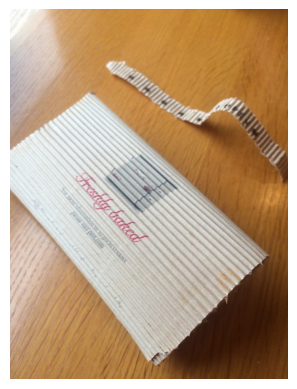

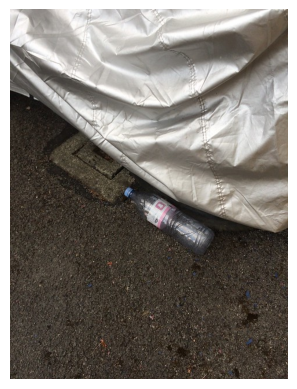

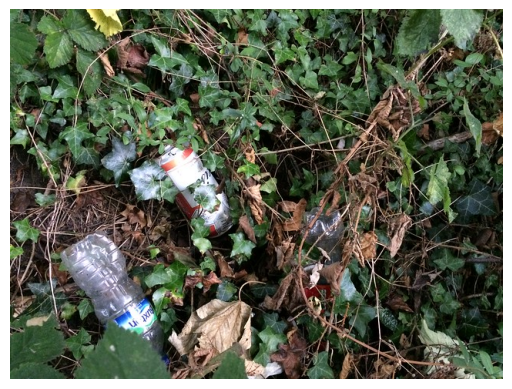

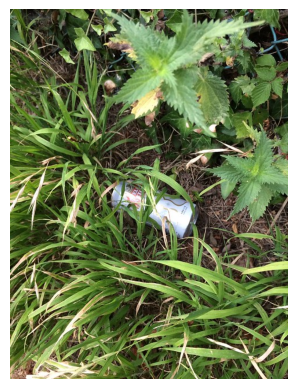

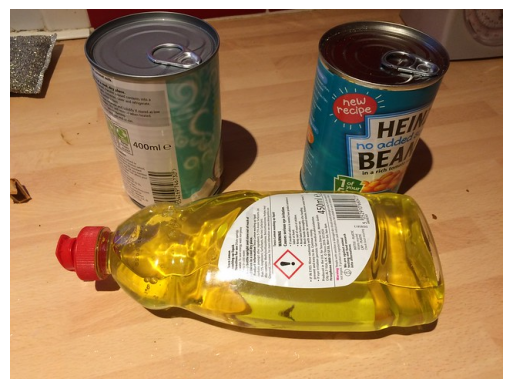

...

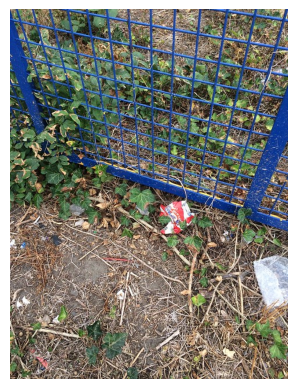

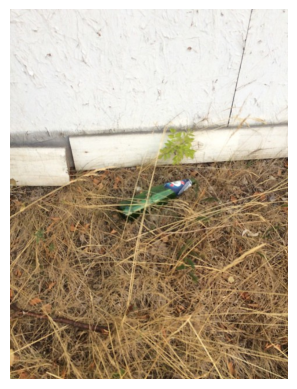

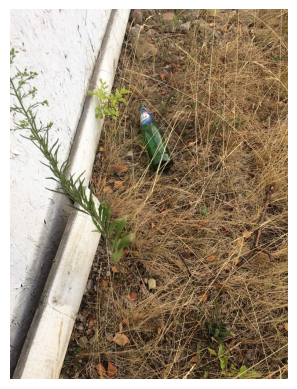

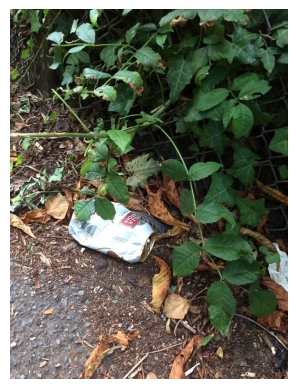

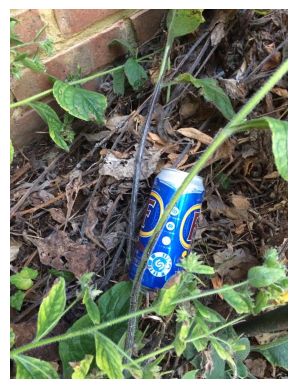

KeyboardInterrupt: 

In [ ]:
import pandas as pd
import requests
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt

# Read the CSV file
csv_file_path = "/content/TACO/data/all_image_urls.csv"  # replace with the correct file path
df = pd.read_csv(csv_file_path)

# Check the first few rows of the CSV to ensure it's loaded correctly
print(df.head())

# Download and display images from the URLs in the CSV
for index, row in df.iterrows():
    url = row['https://farm66.staticflickr.com/65535/33978196618_632623b4fc_z.jpg']  # assuming the column is named 'image_url'

    # Send a GET request to the URL
    response = requests.get(url)

    if response.status_code == 200:
        # Open the image with PIL from the response content
        img = Image.open(BytesIO(response.content))

        # Display the image
        plt.imshow(img)
        plt.axis('off')  # Hide axes
        plt.show()

    else:
        print(f"Failed to retrieve image from {url}")


In [ ]:
# Install required libraries
!pip install tensorflow tensorflowjs albumentations roboflow gradio matplotlib --quiet
!pip install -q tensorflow-model-optimization  # For model pruning

# Import libraries
import tensorflow as tf
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Input, GlobalAveragePooling2D, Dense, Multiply, Reshape
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import AdamW
from tensorflow.keras.losses import BinaryFocalCrossentropy
from tensorflow.keras.callbacks import LearningRateScheduler
import albumentations as A

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.1/89.1 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.5/81.5 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 MB 10.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 321.4/321.4 kB 18.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.8/94.8 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.4/12.4 MB 77.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.2/73.2 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.9/15.9 MB 42.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 615.4/615.4 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 74.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 57

/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.0 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


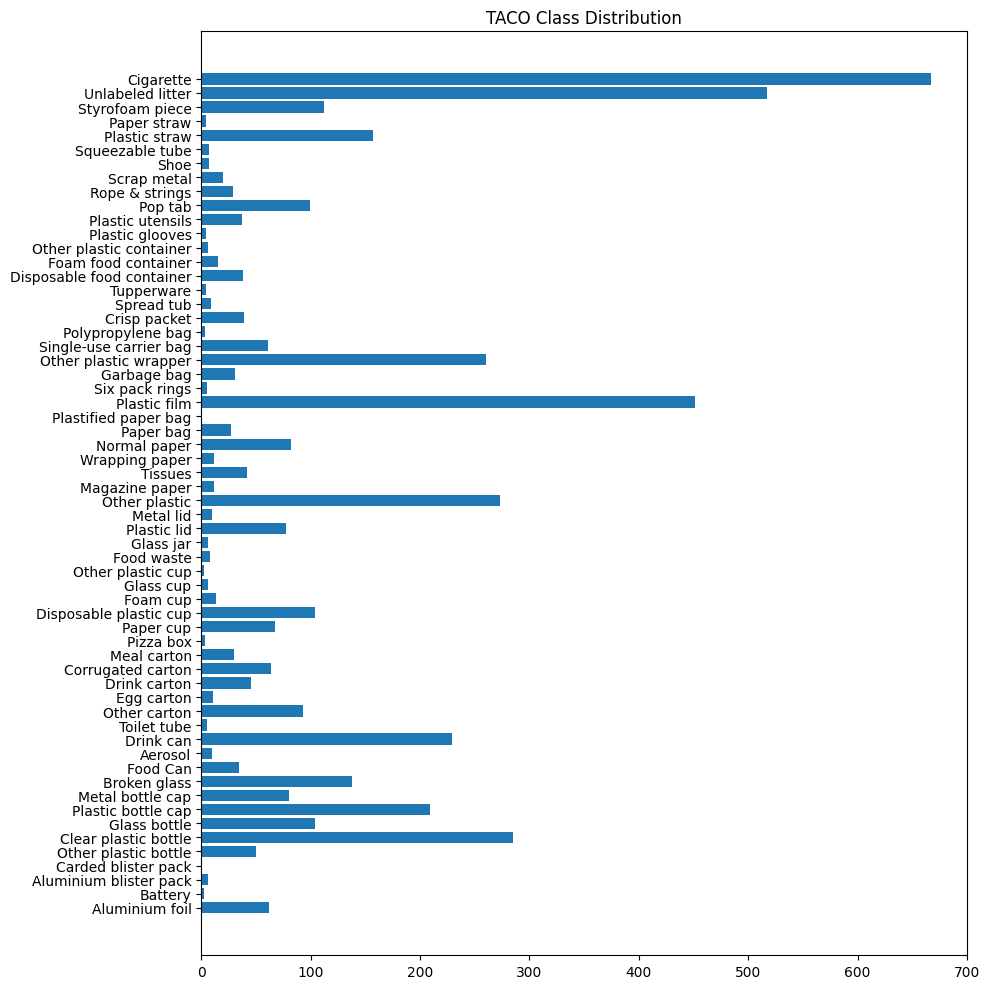

In [ ]:
import json
import matplotlib.pyplot as plt

# Load TACO annotations (replace with your path)
with open('/content/TACO/data/annotations.json') as f:
    annotations = json.load(f)

# Plot class distribution
categories = annotations['categories']
class_counts = {cat['name']: 0 for cat in categories}
for ann in annotations['annotations']:
    class_id = ann['category_id']
    class_name = categories[class_id]['name']
    class_counts[class_name] += 1

# Create the plot with a larger figure size
plt.figure(figsize=(10, 10))  # You can adjust the size as needed
plt.barh(list(class_counts.keys()), list(class_counts.values()))
plt.title('TACO Class Distribution')
plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()


In [ ]:
from roboflow import Roboflow

# Replace with your actual API key
rf = Roboflow(api_key="n4dF3DNoAz9FkESE1l3G")

# Access your workspace and project
project = rf.workspace("plastic-detection").project("plastic-detection")

# Download dataset in TFRecord format
dataset = project.version(1).download("tfrecord")

# Print the location of the downloaded dataset
print(dataset.location)



loading Roboflow workspace...
loading Roboflow project...
Exporting format tfrecord in progress : 85.0%
Version export complete for tfrecord format


BadZipFile: File is not a zip file

In [3]:
!git config --global user.name "Vedanshipathak"
!git config --global user.email "vedanshipathak226@gmail.com"


In [4]:
!echo "# Plastic-Detection-Model" >> README.md
!git init
!git add README.md
!git commit -m "first commit"
!git branch -M main
!git remote add origin https://github.com/vedanshipathak/Plastic-Detection-Model.git
!git push -u origin main


Reinitialized existing Git repository in /content/.git/
[main 67a7cee] first commit
 1 file changed, 1 insertion(+)
error: remote origin already exists.
fatal: could not read Username for 'https://github.com': No such device or address
